In [ ]:
dataset = "/content/drive/MyDrive/2016/imgs"

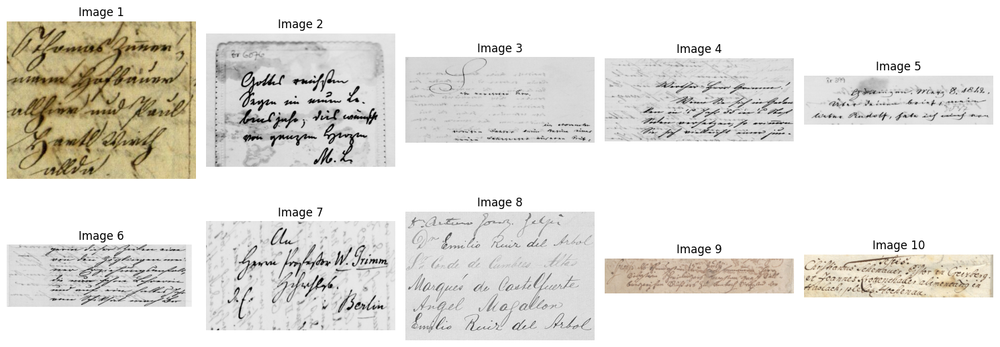

In [ ]:
# Load 10 images
images = []
for i in range(1, 11):  # Assuming images are named 1.bmp
    img = cv2.imread(f'/content/drive/MyDrive/2016/imgs/{i}.png')
    if img is not None:
        images.append(img)
    else:
        print(f"Failed to load image {i}.")

# Display the images in a grid
rows = 2
cols = 5
plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(rows, cols, i+1)
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for matplotlib
    plt.title(f'Image {i+1}')
    plt.axis('off')
plt.tight_layout()
plt.show()


### Imports

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil
from numpy.fft import fft2, ifft2
from scipy.signal import gaussian, convolve2d

### Weiner Filter

In [ ]:
def gaussian_kernel(kernel_size = 3):
    h = gaussian(kernel_size, kernel_size / 3).reshape(kernel_size, 1)
    h = np.dot(h, h.transpose())
    h /= np.sum(h)
    return h

def wiener_filter(img, kernel, K):
    kernel /= np.sum(kernel)
    dummy = np.copy(img)
    dummy = fft2(dummy)
    kernel = fft2(kernel, s = img.shape)
    kernel = np.conj(kernel) / (np.abs(kernel) ** 2 + K)
    dummy = dummy * kernel
    dummy = np.abs(ifft2(dummy))
    return dummy

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])
kernel = gaussian_kernel(3)

<ipython-input-11-dc251b08299a>:2: DeprecationWarning: Importing gaussian from 'scipy.signal' is deprecated and will raise an error in SciPy 1.13.0. Please use 'scipy.signal.windows.gaussian' or the convenience function 'scipy.signal.get_window' instead.
  h = gaussian(kernel_size, kernel_size / 3).reshape(kernel_size, 1)


In [ ]:
###################### Plotting Histograms ##################
def plot_histogram(image, title):
    plt.hist(image.ravel(), bins=256, range=[0, 256], color='r')
    plt.title('Intensity Histogram')
    plt.xlabel('Intensity Value')
    plt.ylabel('Frequency')
    plt.grid()
    plt.tight_layout()

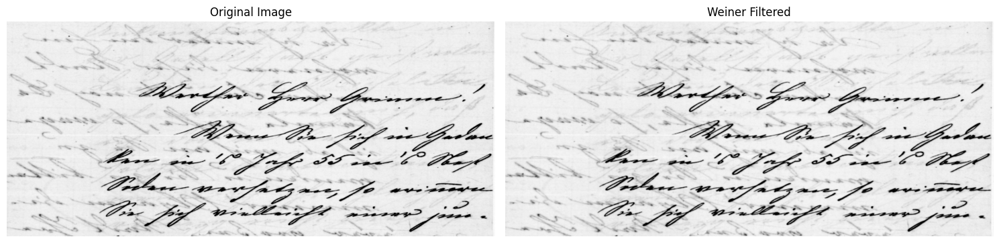

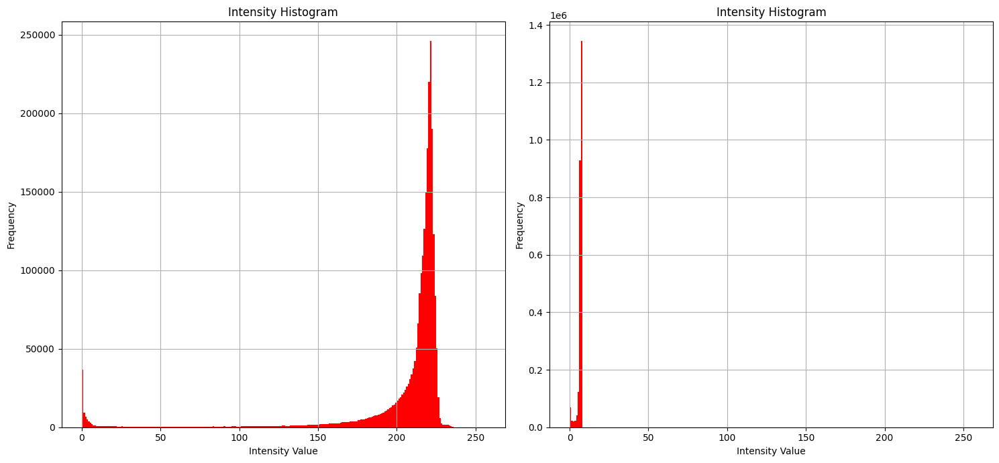

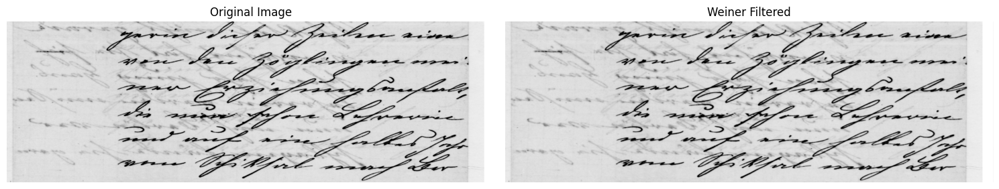

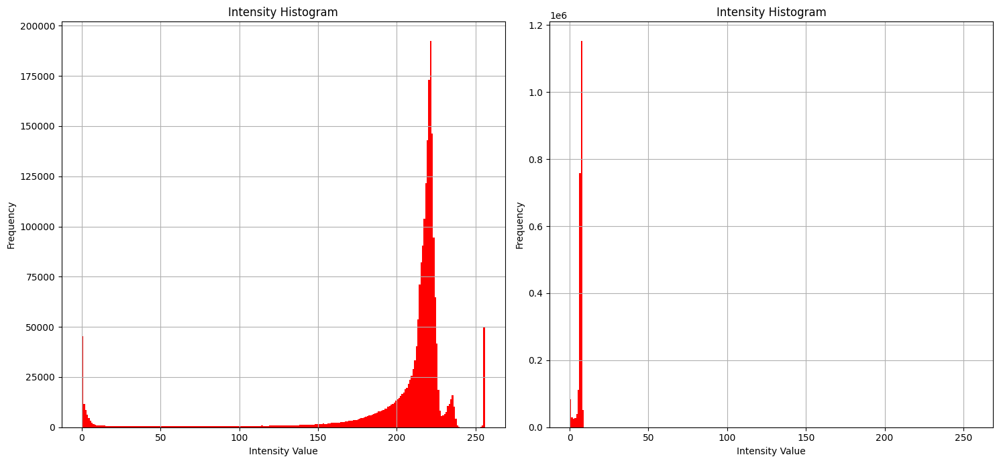

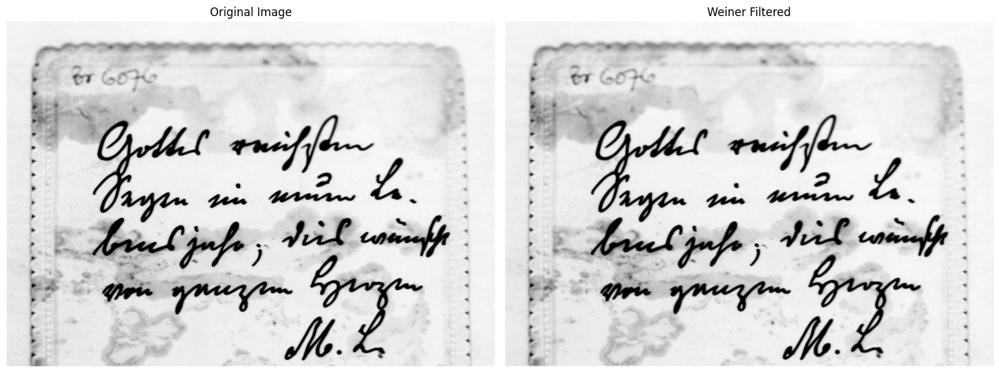

...

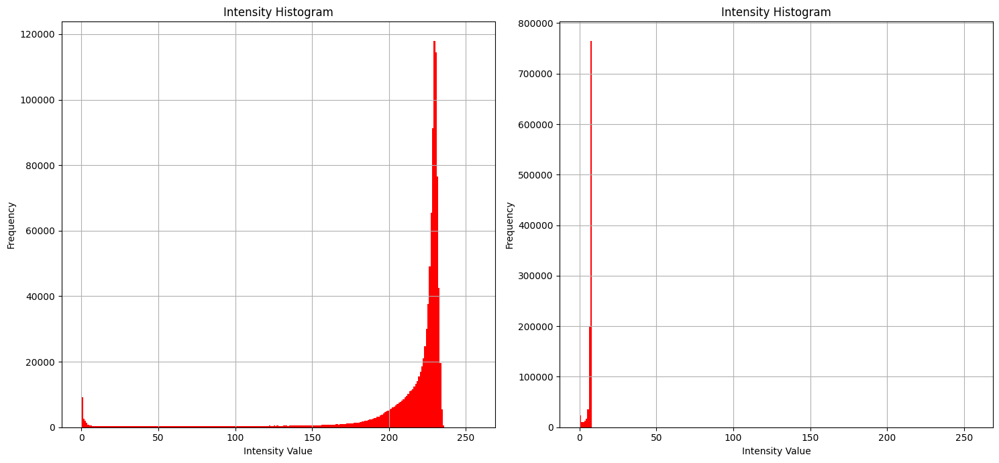

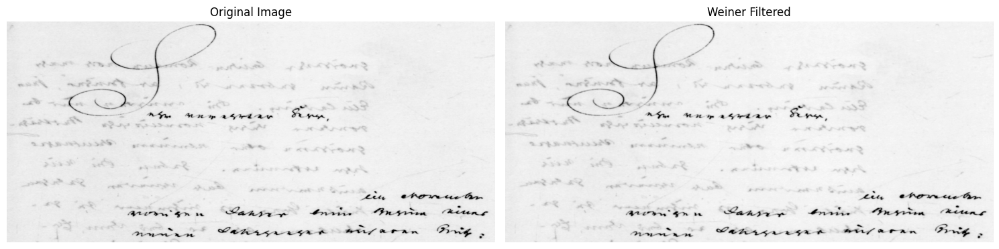

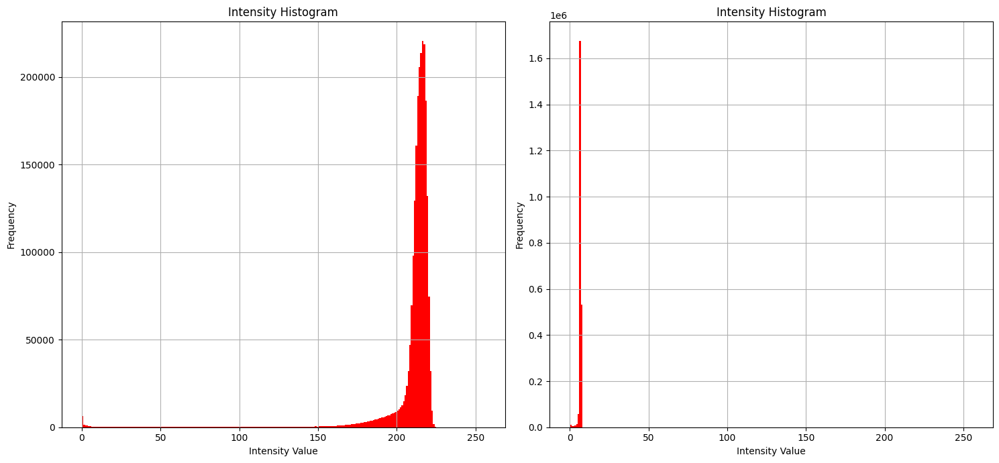

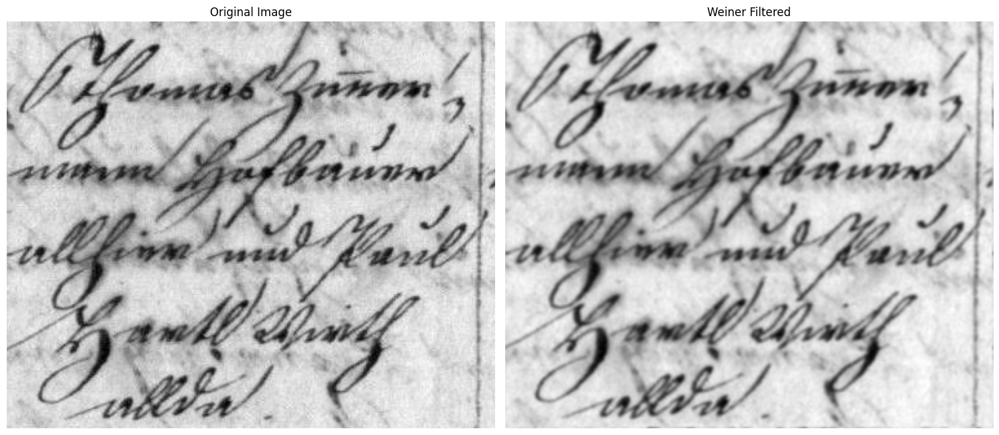

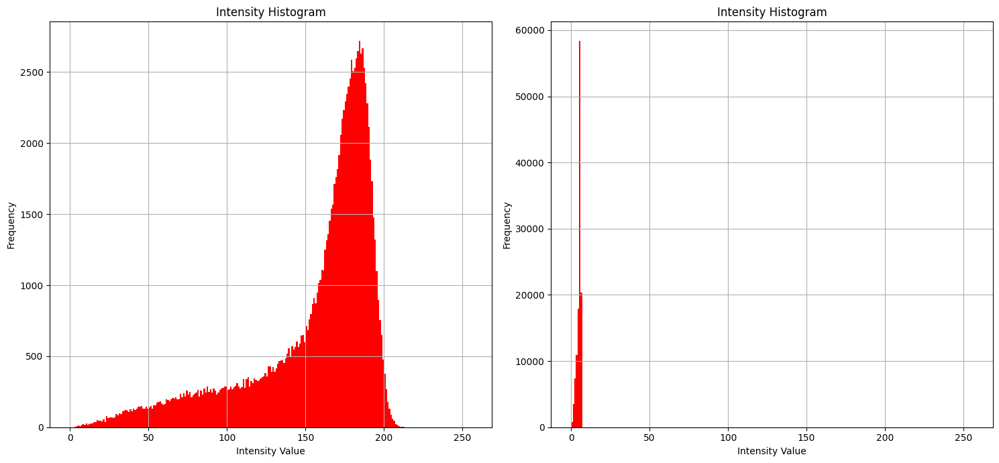

In [ ]:

for img_path in os.listdir(dataset):

      img = cv2.imread(os.path.join(dataset, img_path), 0)
      noise_removed = wiener_filter(img, kernel, K=30)
      cv2.imwrite(f"/content/weiner/{img_path}", noise_removed)

      plt.figure(figsize=(15, 7))

      plt.subplot(1, 2, 1)
      plt.imshow(img, cmap='gray')
      plt.title('Original Image')
      plt.axis('off')

      plt.subplot(1, 2, 2)
      plt.imshow(noise_removed, cmap='gray')
      plt.title('Weiner Filtered')
      plt.axis('off')

      plt.tight_layout()
      plt.show()

      plt.figure(figsize=(15, 7))

      plt.subplot(1, 2, 1)
      plot_histogram(img, 'Original Image Histogram')

      plt.subplot(1, 2, 2)
      plot_histogram(noise_removed, 'Filtered Image Histogram')

      plt.tight_layout()
      plt.show()

### Otsu Threshold


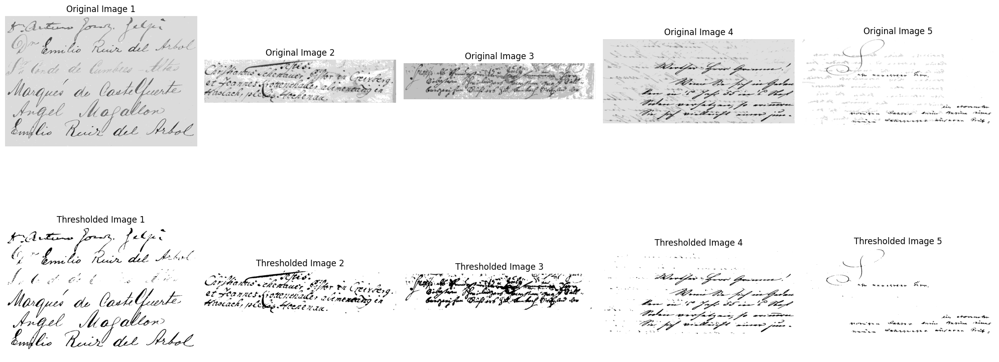

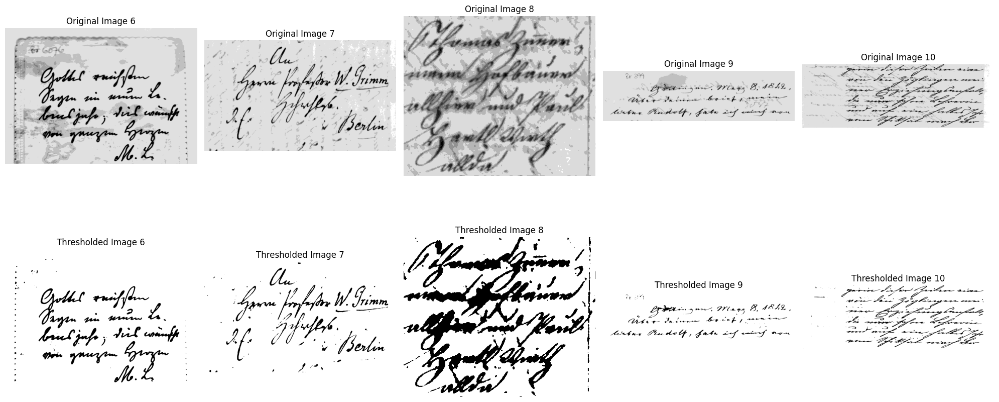

In [ ]:

import cv2
import os
import matplotlib.pyplot as plt

weiner_folder = "/content/weiner"
original_images = []
thresholded_images = []

for img_path in os.listdir(weiner_folder):
    img = cv2.imread(os.path.join(weiner_folder, img_path), 0)

    _, threshold = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    inverted_threshold = cv2.bitwise_not(threshold)

    original_images.append(img)
    thresholded_images.append(inverted_threshold)

plt.figure(figsize=(20, 10))

# Display original images (first 5)
for i in range(5):
    plt.subplot(2, 5, i + 1)
    plt.imshow(original_images[i], cmap='gray')
    plt.title(f'Original Image {i + 1}')
    plt.axis('off')

# Display thresholded images (first 5)
for i in range(5):
    plt.subplot(2, 5, i + 6)
    plt.imshow(thresholded_images[i], cmap='gray')
    plt.title(f'Thresholded Image {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Display original images (next 5)
plt.figure(figsize=(20, 10))
for i in range(5, 10):
    plt.subplot(2, 5, i - 4)
    plt.imshow(original_images[i], cmap='gray')
    plt.title(f'Original Image {i + 1}')
    plt.axis('off')

# Display thresholded images (next 5)
for i in range(5, 10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(thresholded_images[i], cmap='gray')
    plt.title(f'Thresholded Image {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()


### Adaptive Guassian Threshold

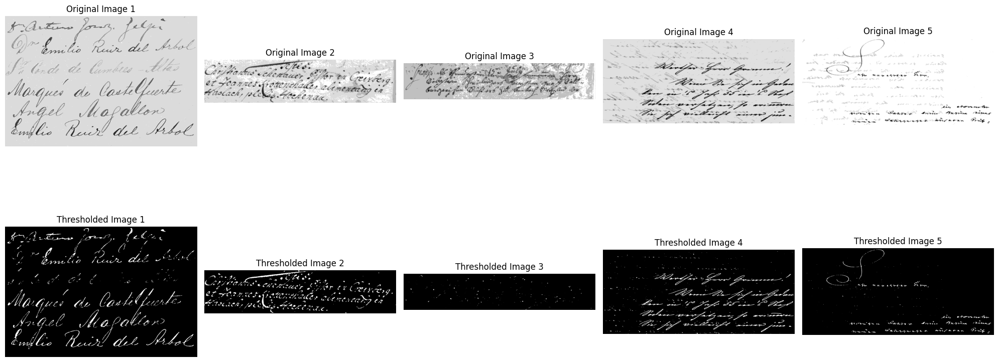

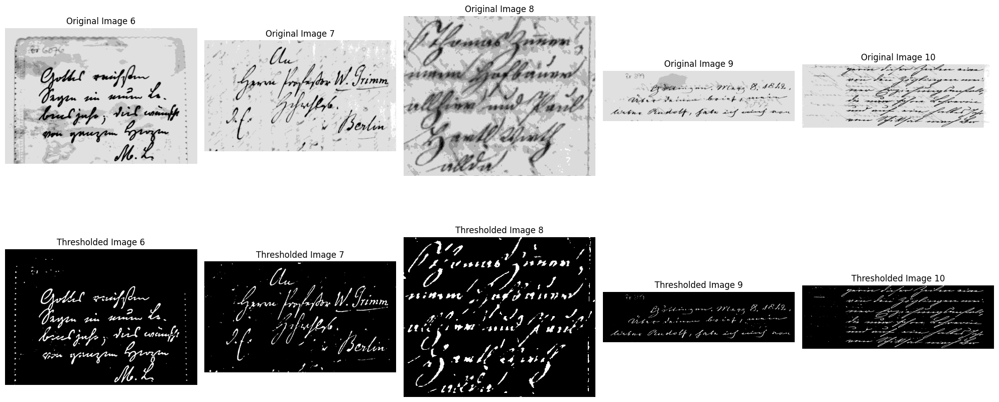

In [ ]:

import cv2
import os
import matplotlib.pyplot as plt

weiner_folder = "/content/weiner"
original_images = []
thresholded_images = []

for img_path in os.listdir(weiner_folder):
    img = cv2.imread(os.path.join(weiner_folder, img_path), 0)
    threshold =  cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 53, 2)

    inverted_threshold = cv2.bitwise_not(threshold)

    original_images.append(img)
    thresholded_images.append(inverted_threshold)

plt.figure(figsize=(20, 10))

# Display original images (first 5)
for i in range(5):
    plt.subplot(2, 5, i + 1)
    plt.imshow(original_images[i], cmap='gray')
    plt.title(f'Original Image {i + 1}')
    plt.axis('off')

# Display thresholded images (first 5)
for i in range(5):
    plt.subplot(2, 5, i + 6)
    plt.imshow(thresholded_images[i], cmap='gray')
    plt.title(f'Thresholded Image {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Display original images (next 5)
plt.figure(figsize=(20, 10))
for i in range(5, 10):
    plt.subplot(2, 5, i - 4)
    plt.imshow(original_images[i], cmap='gray')
    plt.title(f'Original Image {i + 1}')
    plt.axis('off')

# Display thresholded images (next 5)
for i in range(5, 10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(thresholded_images[i], cmap='gray')
    plt.title(f'Thresholded Image {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()


### Sauvola Threshold

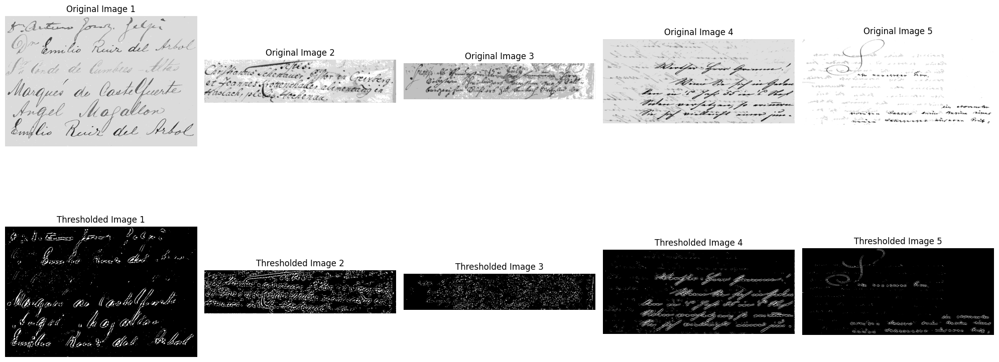

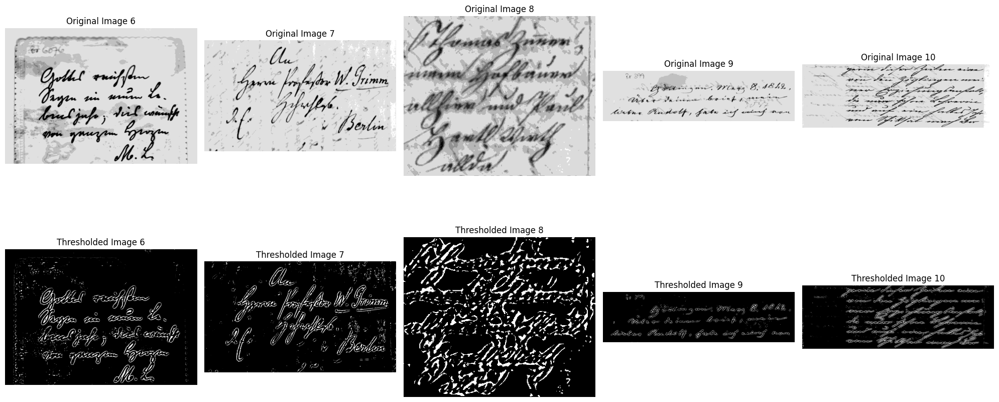

In [ ]:

import cv2
import os
import matplotlib.pyplot as plt

weiner_folder = "/content/weiner"
original_images = []
thresholded_images = []

for img_path in os.listdir(weiner_folder):
    img = cv2.imread(os.path.join(weiner_folder, img_path), 0)
    threshold = cv2.ximgproc.niBlackThreshold(img, maxValue=255, type=cv2.THRESH_BINARY_INV,
                                              blockSize=15, k=0.2)
    inverted_threshold = cv2.bitwise_not(threshold)

    original_images.append(img)
    thresholded_images.append(inverted_threshold)

plt.figure(figsize=(20, 10))

# Display original images (first 5)
for i in range(5):
    plt.subplot(2, 5, i + 1)
    plt.imshow(original_images[i], cmap='gray')
    plt.title(f'Original Image {i + 1}')
    plt.axis('off')

# Display thresholded images (first 5)
for i in range(5):
    plt.subplot(2, 5, i + 6)
    plt.imshow(thresholded_images[i], cmap='gray')
    plt.title(f'Thresholded Image {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Display original images (next 5)
plt.figure(figsize=(20, 10))
for i in range(5, 10):
    plt.subplot(2, 5, i - 4)
    plt.imshow(original_images[i], cmap='gray')
    plt.title(f'Original Image {i + 1}')
    plt.axis('off')

# Display thresholded images (next 5)
for i in range(5, 10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(thresholded_images[i], cmap='gray')
    plt.title(f'Thresholded Image {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

## Evaluation

### PSNR

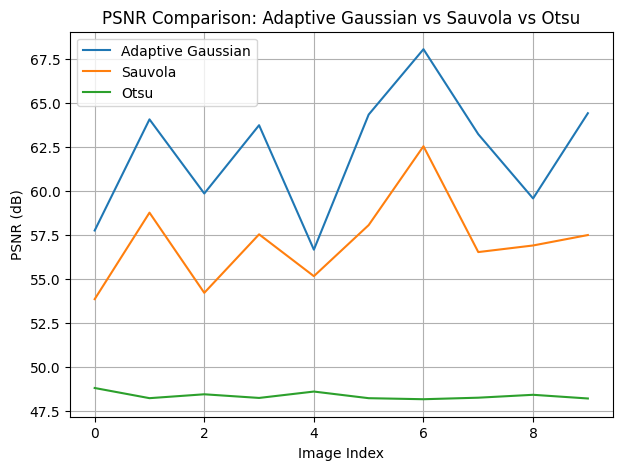

In [ ]:
# PSNR
def calculate_psnr(gt, pred):
    mse = np.mean((gt - pred) ** 2)
    max_pixel = 255.0
    psnr = 10 * np.log10((max_pixel ** 2) / mse)
    return psnr

gt_folder =  "/content/drive/MyDrive/2016/gt_imgs"
adaptive_gaussian_folder = "/content/adaptive_guassian"
sauvola_folder = "/content/sauvola"
otsu_folder = "/content/otsu"

psnr_values_adaptive_gaussian = {}
psnr_values_sauvola = {}
psnr_values_otsu = {}

for gt_img_name in os.listdir(gt_folder):
    gt_img_path = os.path.join(gt_folder, gt_img_name)
    gt_img = cv2.imread(gt_img_path, cv2.IMREAD_GRAYSCALE)

    img_path_adaptive_gaussian = os.path.join(adaptive_gaussian_folder, gt_img_name)
    img_path_sauvola = os.path.join(sauvola_folder, gt_img_name)
    img_path_otsu = os.path.join(otsu_folder, gt_img_name)

    img_adaptive_gaussian = cv2.imread(img_path_adaptive_gaussian, cv2.IMREAD_GRAYSCALE)
    img_sauvola = cv2.imread(img_path_sauvola, cv2.IMREAD_GRAYSCALE)
    img_otsu = cv2.imread(img_path_otsu, cv2.IMREAD_GRAYSCALE)

    resized_gt_img = cv2.resize(gt_img, (img_adaptive_gaussian.shape[1], img_adaptive_gaussian.shape[0]))

    psnr_adaptive_gaussian = calculate_psnr(resized_gt_img, img_adaptive_gaussian)
    psnr_sauvola = calculate_psnr(resized_gt_img, img_sauvola)
    psnr_otsu = calculate_psnr(resized_gt_img, img_otsu)

    psnr_values_adaptive_gaussian[gt_img_name] = psnr_adaptive_gaussian
    psnr_values_sauvola[gt_img_name] = psnr_sauvola
    psnr_values_otsu[gt_img_name] = psnr_otsu

# Plotting PSNR values
plt.figure(figsize=(7, 5))
plt.plot(psnr_values_adaptive_gaussian.values(), label='Adaptive Gaussian')
plt.plot(psnr_values_sauvola.values(), label='Sauvola')
plt.plot(psnr_values_otsu.values(), label='Otsu')
plt.xlabel('Image Index')
plt.ylabel('PSNR (dB)')
plt.title('PSNR Comparison: Adaptive Gaussian vs Sauvola vs Otsu')
plt.legend()
plt.grid(True)
plt.show()


### DRD

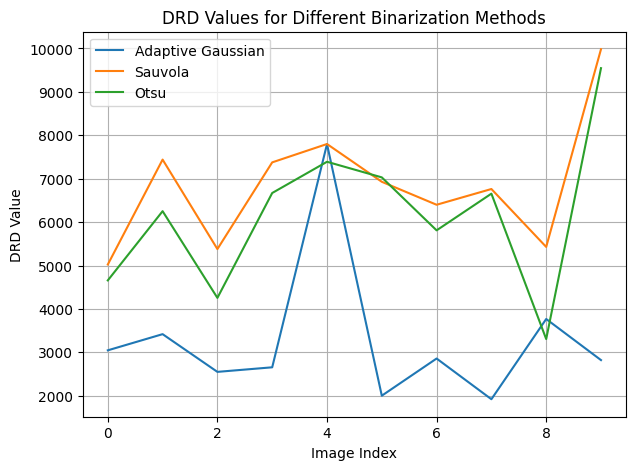

In [ ]:

def calculate_drd(gt, pred):
    nubn = calculate_nubn(gt)
    drd = 1 / nubn * np.sum(np.abs(pred - gt))

    return drd

def calculate_nubn(img):
    nubn = 0
    for i in range(0, img.shape[0] - 7, 8):
        for j in range(0, img.shape[1] - 7, 8):
            patch = img[i:i+8, j:j+8]
            if not is_uniform(patch):
                nubn += 1

    return nubn

def is_uniform(patch):
    return len(np.unique(patch)) == 1

gt_folder =  "/content/drive/MyDrive/2016/gt_imgs"
adaptive_gaussian_folder = "/content/adaptive_guassian"
sauvola_folder = "/content/sauvola"
otsu_folder = "/content/otsu"

drd_values_adaptive_gaussian = []
drd_values_sauvola = []
drd_values_otsu = []

for gt_img_name in os.listdir(gt_folder):
    gt_img_path = os.path.join(gt_folder, gt_img_name)
    gt_img = cv2.imread(gt_img_path, cv2.IMREAD_GRAYSCALE)

    img_path_adaptive_gaussian = os.path.join(adaptive_gaussian_folder, gt_img_name)
    img_path_sauvola = os.path.join(sauvola_folder, gt_img_name)
    img_path_otsu = os.path.join(otsu_folder, gt_img_name)

    img_adaptive_gaussian = cv2.imread(img_path_adaptive_gaussian, cv2.IMREAD_GRAYSCALE)
    img_sauvola = cv2.imread(img_path_sauvola, cv2.IMREAD_GRAYSCALE)
    img_otsu = cv2.imread(img_path_otsu, cv2.IMREAD_GRAYSCALE)

    resized_gt_img = cv2.resize(gt_img, (img_adaptive_gaussian.shape[1], img_adaptive_gaussian.shape[0]))

    drd_adaptive_gaussian = calculate_drd(resized_gt_img, img_adaptive_gaussian)
    drd_sauvola = calculate_drd(resized_gt_img, img_sauvola)
    drd_otsu = calculate_drd(resized_gt_img, img_otsu)

    drd_values_adaptive_gaussian.append(drd_adaptive_gaussian)
    drd_values_sauvola.append(drd_sauvola)
    drd_values_otsu.append(drd_otsu)

# Plot DRD values
plt.figure(figsize=(7, 5))
plt.plot(drd_values_adaptive_gaussian, label='Adaptive Gaussian')
plt.plot(drd_values_sauvola, label='Sauvola')
plt.plot(drd_values_otsu, label='Otsu')
plt.xlabel('Image Index')
plt.ylabel('DRD Value')
plt.title('DRD Values for Different Binarization Methods')
plt.legend()
plt.grid(True)
plt.show()


### IoU

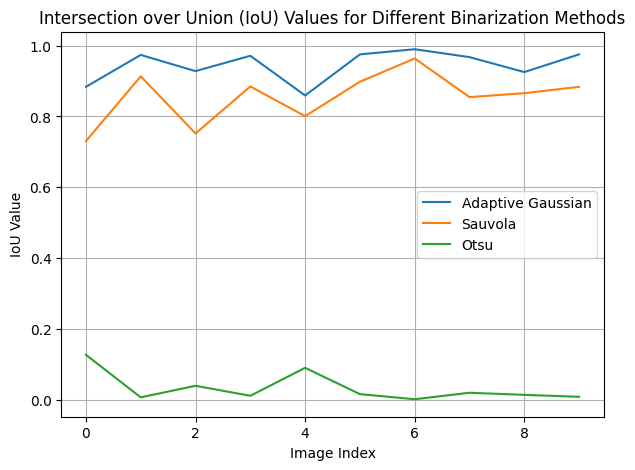

In [ ]:


def calculate_iou(gt, pred):
    intersection = np.logical_and(gt, pred)
    union = np.logical_or(gt, pred)
    iou = np.sum(intersection) / np.sum(union)
    return iou

gt_folder = "/content/drive/MyDrive/2016/gt_imgs"
adaptive_gaussian_folder = "/content/adaptive_guassian"
sauvola_folder = "/content/sauvola"
otsu_folder = "/content/otsu"

iou_values_adaptive_gaussian = []
iou_values_sauvola = []
iou_values_otsu = []

# Iterate over each image in the ground truth folder
for gt_img_name in os.listdir(gt_folder):
    gt_img_path = os.path.join(gt_folder, gt_img_name)
    gt_img = cv2.imread(gt_img_path, cv2.IMREAD_GRAYSCALE)

    img_path_adaptive_gaussian = os.path.join(adaptive_gaussian_folder, gt_img_name)
    img_path_sauvola = os.path.join(sauvola_folder, gt_img_name)
    img_path_otsu = os.path.join(otsu_folder, gt_img_name)

    img_adaptive_gaussian = cv2.imread(img_path_adaptive_gaussian, cv2.IMREAD_GRAYSCALE)
    img_sauvola = cv2.imread(img_path_sauvola, cv2.IMREAD_GRAYSCALE)
    img_otsu = cv2.imread(img_path_otsu, cv2.IMREAD_GRAYSCALE)

    # Resize ground truth image to match other images
    resized_gt_img = cv2.resize(gt_img, (img_adaptive_gaussian.shape[1], img_adaptive_gaussian.shape[0]))

    iou_adaptive_gaussian = calculate_iou(resized_gt_img, img_adaptive_gaussian)
    iou_sauvola = calculate_iou(resized_gt_img, img_sauvola)
    iou_otsu = calculate_iou(resized_gt_img, img_otsu)

    iou_values_adaptive_gaussian.append(iou_adaptive_gaussian)
    iou_values_sauvola.append(iou_sauvola)
    iou_values_otsu.append(iou_otsu)

# Plot IoU values
plt.figure(figsize=(7, 5))
plt.plot(iou_values_adaptive_gaussian, label='Adaptive Gaussian')
plt.plot(iou_values_sauvola, label='Sauvola')
plt.plot(iou_values_otsu, label='Otsu')
plt.xlabel('Image Index')
plt.ylabel('IoU Value')
plt.title('Intersection over Union (IoU) Values for Different Binarization Methods')
plt.legend()
plt.grid(True)
plt.show()


### SSIM

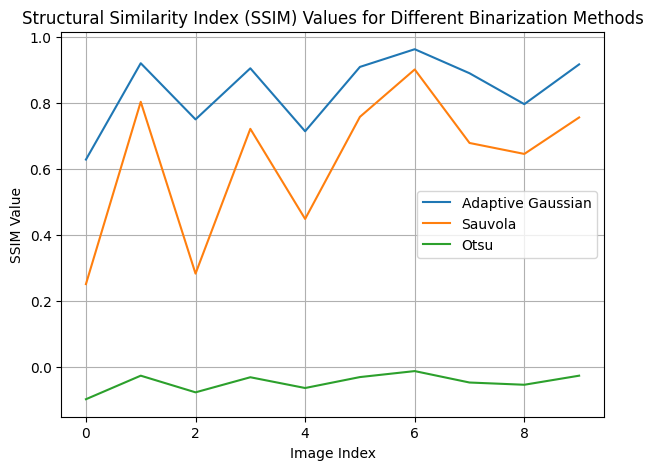

In [ ]:
## SIM
from skimage.metrics import structural_similarity as ssim

def calculate_ssim(gt, pred):
    ssim_score, _ = ssim(gt, pred, full=True)
    return ssim_score

gt_folder = "/content/drive/MyDrive/2016/gt_imgs"
adaptive_gaussian_folder = "/content/adaptive_guassian"
sauvola_folder = "/content/sauvola"
otsu_folder = "/content/otsu"

ssim_values_adaptive_gaussian = []
ssim_values_sauvola = []
ssim_values_otsu = []

for gt_img_name in os.listdir(gt_folder):
    gt_img_path = os.path.join(gt_folder, gt_img_name)
    gt_img = cv2.imread(gt_img_path, cv2.IMREAD_GRAYSCALE)

    img_path_adaptive_gaussian = os.path.join(adaptive_gaussian_folder, gt_img_name)
    img_path_sauvola = os.path.join(sauvola_folder, gt_img_name)
    img_path_otsu = os.path.join(otsu_folder, gt_img_name)

    img_adaptive_gaussian = cv2.imread(img_path_adaptive_gaussian, cv2.IMREAD_GRAYSCALE)
    img_sauvola = cv2.imread(img_path_sauvola, cv2.IMREAD_GRAYSCALE)
    img_otsu = cv2.imread(img_path_otsu, cv2.IMREAD_GRAYSCALE)

    resized_gt_img = cv2.resize(gt_img, (img_adaptive_gaussian.shape[1], img_adaptive_gaussian.shape[0]))

    ssim_adaptive_gaussian = calculate_ssim(resized_gt_img, img_adaptive_gaussian)
    ssim_sauvola = calculate_ssim(resized_gt_img, img_sauvola)
    ssim_otsu = calculate_ssim(resized_gt_img, img_otsu)

    ssim_values_adaptive_gaussian.append(ssim_adaptive_gaussian)
    ssim_values_sauvola.append(ssim_sauvola)
    ssim_values_otsu.append(ssim_otsu)

# Plot SSIM values
plt.figure(figsize=(7, 5))
plt.plot(ssim_values_adaptive_gaussian, label='Adaptive Gaussian')
plt.plot(ssim_values_sauvola, label='Sauvola')
plt.plot(ssim_values_otsu, label='Otsu')
plt.xlabel('Image Index')
plt.ylabel('SSIM Value')
plt.title('Structural Similarity Index (SSIM) Values for Different Binarization Methods')
plt.legend()
plt.grid(True)
plt.show()
